### Background / Introduction

I did a bit of reading on the general process for penetration testing (https://www.eccouncil.org/cybersecurity-exchange/penetration-testing/penetration-testing-phases/#:~:text=There%20are%20five%20penetration%20testing,the%205%20Penetration%20Testing%20phases.) and I believe some areas in the process which would benefit from data science concepts are:

1) Reconnaissance: 

    - Automation of information gathering

2) Scanning: 

    - Identification of potential threats: this would likely entail logistic regression or a decision tree for classification of the data. Logistic regression would be 0 - no threat or 1 - threat, while a decision tree may offer more insight as to the level of threat (could still use the sigmoid function but categorize into threat levels by % chance of threat instead of just binary).
    
    - Anomaly detection

3) Vulnerability Assessment:

    - Risk assessment
    
5) Reporting:

    - Automated reporting by leveraging Python and PowerBi.
    
In this notebook I will showcase how data science and python can be used in parts 2 and 5 of the penetration testing process. I will create a logistic regression model which identifies aspects of data as threat / no threat in a modular format to prove the making of such a model can be automated. For simplicity of the logistic regression model, we will treat the data (though it appears to be longitudinal) as independent observations since we would like to know if that sensor at that time is a threat or not.

I will then generate bar plots and longitudinal line plots to help spot anomalies/outliers.

### Scanning

Identification of potential threats. Would need historical 'threat' data from clients to predict future threats.

In [1]:
#import normal packages
import pandas as pd
import numpy as np
import sklearn as sk
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [2]:
#set project path
project_folder = 'C:/Users/beech/Documents/Jobs/Cobalt/'

In [3]:
#read in data
df = pd.read_csv(project_folder +'data/smart_system_anomaly_dataset.csv')
df.head()

,timestamp,device_id,device_type,cpu_usage,memory_usage,network_in_kb,network_out_kb,packet_rate,avg_response_time_ms,service_access_count,failed_auth_attempts,is_encrypted,geo_location_variation,label
0,2025-06-20 12:51:55.452400,thermostat_38,thermostat,66.74,75.54,77,849,372,419.92,2,7,0,18.19,Normal
1,2025-06-20 12:51:56.452400,smart_light_37,smart,19.92,16.70,526,1492,635,32.69,3,3,1,2.98,Normal
2,2025-06-20 12:51:57.452400,sensor_1,sensor,10.08,48.62,577,923,220,418.91,4,10,0,9.66,Normal
3,2025-06-20 12:51:58.452400,sensor_9,sensor,68.60,22.46,400,240,769,66.81,5,6,1,15.00,Anomaly_DoS
4,2025-06-20 12:51:59.452400,smart_light_31,smart,50.62,48.15,104,1176,605,340.41,7,1,1,11.21,Normal


### Data Cleaning, Transformation and Aggregation

First, because at this time I only want to detect threat or no threat, I am going to use a lambda function to make a new column containing the values 'Normal' (if the label column is normal) and 'Threat' if the label column is anything else.

Then, before making a logistic regression model, there are a few things we need to do to this data. These are to drop the columns we will not be using - 'timestamp' and 'label'. We will also need to convert 'device_type' and 'device_id' to a numeric variable using one hot encoding (logistic regression cannot process string data).

Finally, we will split the data into training/testing data.

In [4]:
def categorize_threat(column):
    if column == 'Normal':
        return 'Normal'
    else:
        return 'Threat'

In [5]:
df['threat_cat'] = df['label'].apply(lambda x: 'Normal' if x == 'Normal' else 'Threat')
df.head()

,timestamp,device_id,device_type,cpu_usage,memory_usage,network_in_kb,network_out_kb,packet_rate,avg_response_time_ms,service_access_count,failed_auth_attempts,is_encrypted,geo_location_variation,label,threat_cat
0,2025-06-20 12:51:55.452400,thermostat_38,thermostat,66.74,75.54,77,849,372,419.92,2,7,0,18.19,Normal,Normal
1,2025-06-20 12:51:56.452400,smart_light_37,smart,19.92,16.70,526,1492,635,32.69,3,3,1,2.98,Normal,Normal
2,2025-06-20 12:51:57.452400,sensor_1,sensor,10.08,48.62,577,923,220,418.91,4,10,0,9.66,Normal,Normal
3,2025-06-20 12:51:58.452400,sensor_9,sensor,68.60,22.46,400,240,769,66.81,5,6,1,15.00,Anomaly_DoS,Threat
4,2025-06-20 12:51:59.452400,smart_light_31,smart,50.62,48.15,104,1176,605,340.41,7,1,1,11.21,Normal,Normal


In [6]:
#drop timestamp column and old label column
df2 = df.drop(['label','timestamp'],axis=1)

In [7]:
#get dummies for categorical variables - one hot encoding
cats = df[['device_id', 'device_type']]
dums = {col: pd.get_dummies(cats[col], drop_first=True) for col in cats.columns}

In [8]:
df2 = df2.drop(['device_id','device_type'],axis=1)

In [9]:
def concat_dict(dict_to_concat, df):
    for key, val in dict_to_concat.items():
        df = pd.concat([df, dict_to_concat[key]],axis=1)
    return df

In [10]:
df3 = concat_dict(dums, df2)

In [11]:
df3.head()

,cpu_usage,memory_usage,network_in_kb,network_out_kb,packet_rate,avg_response_time_ms,service_access_count,failed_auth_attempts,is_encrypted,geo_location_variation,...,thermostat_49,thermostat_5,thermostat_50,thermostat_6,thermostat_7,thermostat_8,thermostat_9,sensor,smart,thermostat
0,66.74,75.54,77,849,372,419.92,2,7,0,18.19,...,0,0,0,0,0,0,0,0,0,1
1,19.92,16.70,526,1492,635,32.69,3,3,1,2.98,...,0,0,0,0,0,0,0,0,1,0
2,10.08,48.62,577,923,220,418.91,4,10,0,9.66,...,0,0,0,0,0,0,0,1,0,0
3,68.60,22.46,400,240,769,66.81,5,6,1,15.00,...,0,0,0,0,0,0,0,1,0,0
4,50.62,48.15,104,1176,605,340.41,7,1,1,11.21,...,0,0,0,0,0,0,0,0,1,0


Next, I have to subset the data into training and testing sets, to prevent data leakage.

In [12]:
def split_data(df, target_col):
    y = df[target_col]
    x = df.drop(target_col, axis=1)
    
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=11)
    return x_train, x_test, y_train, y_test

In [13]:
x_train, x_test, y_train, y_test = split_data(df3, 'threat_cat')
x_train.head()

,cpu_usage,memory_usage,network_in_kb,network_out_kb,packet_rate,avg_response_time_ms,service_access_count,failed_auth_attempts,is_encrypted,geo_location_variation,...,thermostat_49,thermostat_5,thermostat_50,thermostat_6,thermostat_7,thermostat_8,thermostat_9,sensor,smart,thermostat
4199,29.22,47.49,305,855,651,239.77,1,10,0,18.75,...,0,0,0,0,0,0,0,0,1,0
757,32.03,58.01,174,1015,230,236.73,9,5,1,15.94,...,0,0,0,0,0,0,0,1,0,0
4001,14.17,24.32,421,692,27,316.29,6,10,1,5.82,...,0,0,0,0,0,0,0,0,0,0
8163,30.15,57.15,403,195,514,254.32,4,10,1,10.64,...,0,0,0,0,0,0,0,0,0,1
4250,32.53,45.04,1479,1220,244,85.97,6,1,0,17.53,...,0,0,0,0,0,0,0,0,0,0


### Training

To prove that training could be automated, I will write a function that trains on all the variables and then get the "importance" of those variables by multiplying the coefficient times standard deviation. An alternative method could be to automate a chi-squared hypothesis test, but I decided against this since there's no guarantee that for all datasets the independent variables have any statistically significant relationship with the dependent variable.

The function will first train using all available variables and then calculate the importance, it will also take in a desired importance threshold and keep variables at or above the threshold, then retrain.

In [14]:
def select_features(x_train, y_train, threshold):
    clf = LogisticRegression(random_state=0).fit(x_train, y_train)
    
    l_coefs = list()
    for i in clf.coef_:
        for x in i:
            l_coefs.append(x)
            
    l_std = list()
    for col, coef in zip(x_train.columns, l_coefs):
        l_std.append((col, x_train[col].std()*coef))
    std_df = pd.DataFrame(l_std, columns=['col','importance'])
    
    #keep variables above selected threshold
    to_keep = [i for i,j in zip(std_df['col'],std_df['importance']) if abs(j)>=threshold]
    
    clf_select = LogisticRegression(random_state=0).fit(x_train[to_keep],y_train)
    return to_keep, clf_select

In [15]:
kept, clf_select = select_features(x_train, y_train, 0.06)

C:\Users\beech\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\beech\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

In [16]:
y_pred = clf_select.predict(x_test[kept])
y_pred

array(['Normal', 'Normal', 'Normal', ..., 'Normal', 'Normal', 'Normal'],
      dtype=object)

In [17]:
from sklearn.metrics import accuracy_score

In [18]:
accuracy_score(y_test, y_pred)

0.7915

We could also set a certain threshold we want the model to perform at and keep trying different methods until the desired accuracy (or other performance metric) is scored.

### Reporting

Functions for automating graphs for reporting:

    - Anomalies for numeric variables
    - Bar Graph Counds for threats in groups

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

### Categorical

In [20]:
def make_barplots(cat, df, sub_cat, count_col):
    grp = df.groupby([cat,sub_cat])[count_col].count().reset_index()
    sns.barplot(x=cat, y=count_col, hue=sub_cat, data=grp)

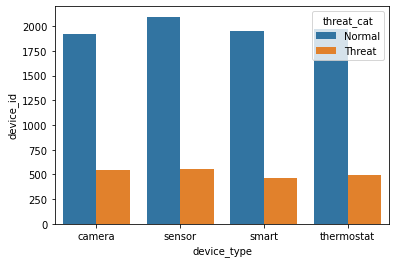

In [21]:
#It really only makes sense to make a barplot for the device types since device id and threat cat are the only other object
#/categorical variables and device id has too many observations to visualize this way.
make_barplots('device_type', df, 'threat_cat','device_id')

With more time, the barplot function could be made to plot categories if the number of groups in that category is below a certain threshold and then to plot certain groups in categories above that threshold only if the threat level is above a certain ratio.

### Numeric

In [22]:
#drop non numeric columns from dataframe
df_nums = df.drop(['device_type','label','threat_cat'],axis=1)

In [23]:
unique_device = list(df['device_id'].unique())

In [193]:
#make dictionary of dataframes to loop through and generate graphs for
d = dict()
for device in unique_device:
    d[device] = df_nums[df_nums['device_id']==device].drop('device_id',axis=1)

In [194]:
#function for finding outliers in a series
def find_outliers(data):
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    iqr = q3 - q1

    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)

    outliers = data[(data < lower_bound) | (data > upper_bound)]

    return outliers

In [201]:
#test that outlier function is working by adding an outrageous number to a column in one of our device dataframes
tst = list(d['thermostat_38']['packet_rate'])
tst.append(1382916)
tst = np.array(tst)
tst

array([    372,     546,     407,      66,      45,     875,     991,
           554,     580,     816,     867,     149,     534,     552,
           636,     194,     893,     463,     225,      70,     394,
            54,      86,     257,     959,      88,     708,     749,
           594,     198,     835,     723,     851,     761,     574,
           579,     990,     619,      88,     505,      67,     702,
            73,     185,     853,     884,     768,     134,      79,
       1382916])

In [202]:
#test if the iqr outlier finding function works
to = find_outliers(tst)
to

array([1382916])

It works!

In [207]:
#test
t = find_outliers(d['thermostat_38']['cpu_usage'])
print(len(t))

0


C:\Users\beech\AppData\Local\Temp/ipykernel_20016/411441509.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8, 5))


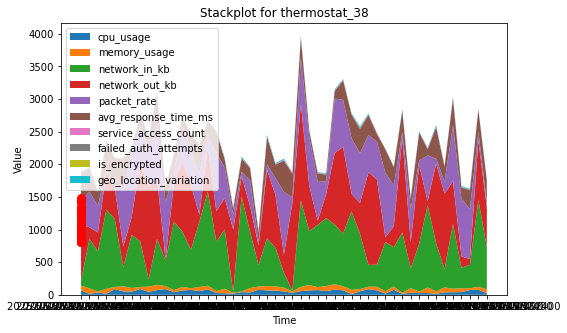

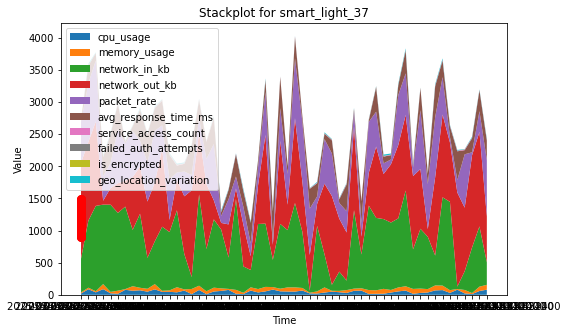

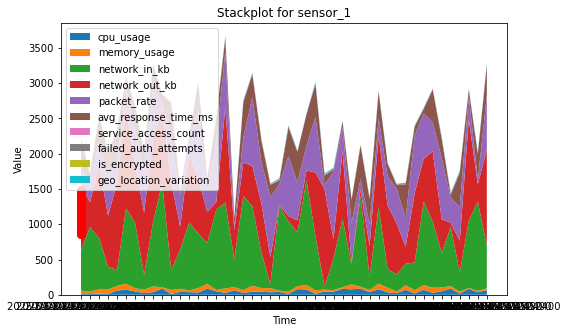

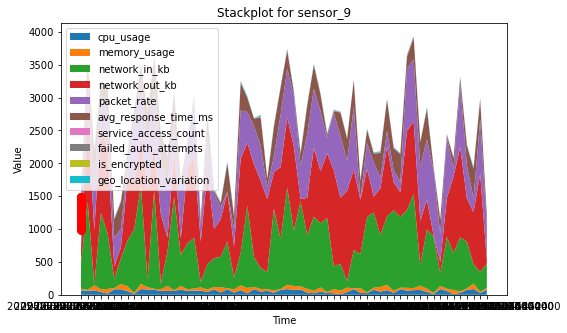

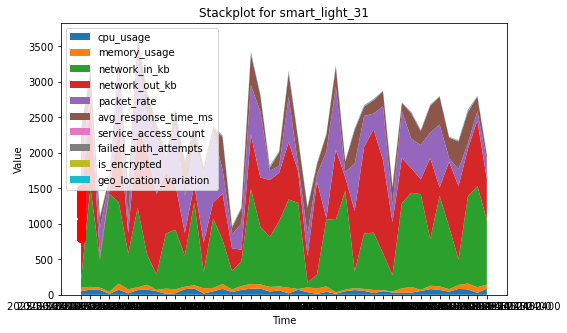

...

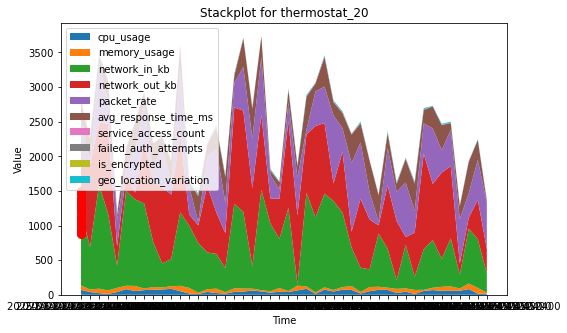

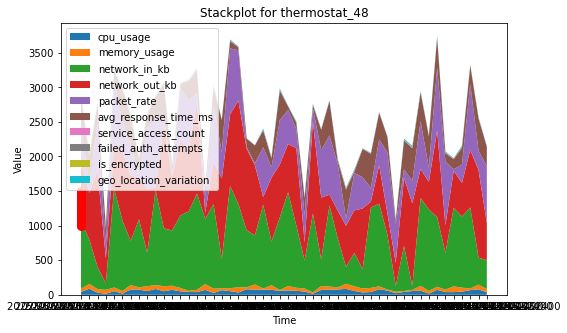

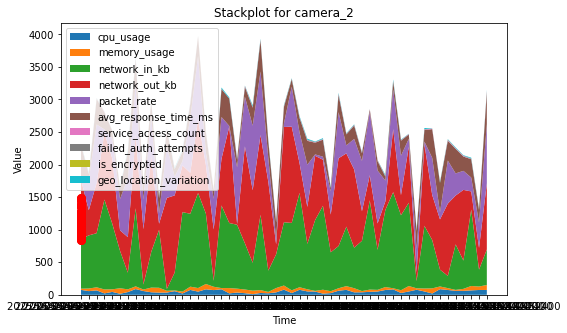

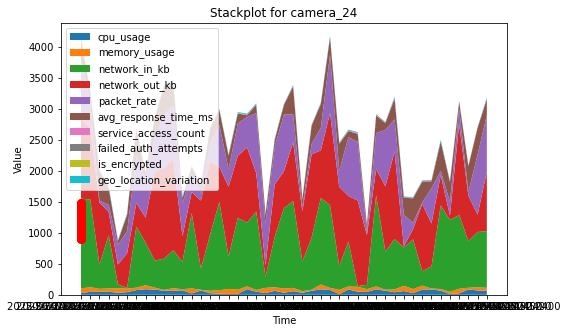

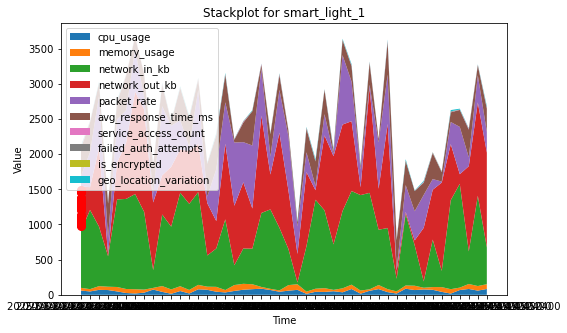

In [217]:
#Iterate through dictionary of device dataframes to plot longitudinal data per device. If there is an outlier in any of the
#columns, plot that outlier on the stacked plot.
for device, df in d.items():
    fig, ax = plt.subplots(figsize=(8, 5))
    x = df['timestamp']
    y = df.drop('timestamp', axis=1).T.values
    labels = df.drop('timestamp', axis=1).columns.tolist()
    
    ax.stackplot(x, y, labels=labels)

    # Add title and labels
    ax.set_title(f'Stackplot for {device}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')

    # Add a legend
    ax.legend(loc='upper left')
    
    outlier_y = find_outliers(y)
    if len(outlier_y) > 0:
        l = list(outlier_y)
        for i in l:
            ax.plot(i, 'ro', markersize=8, label='Outlier')
    else:
        continue

#### Comment:
Funny enough, there were no outliers (in regards to their respective column using interquartile ranges).

### Conclusion

It seems possible to automate the training and testing of logistic regression models to detect "threats". There are definitely more considerations to be taken into place given more time. Perhaps utilizing the Chi-Squared Hypothesis test to select variables and only accepting variables over a certain threshold if there are no variables with a statistically significant relationship. One could also write functions for the amount of information added per variable to account for collinearity and/or implement functions for forwards and backwards stepwise selection to make sure the automatic training process gets the absolute best model possible.

It would also be feasible to automate certain graphs for variables of each type automatically in a given dataset and to point out outliers right away.